# Analyzing single-lineage models

## Setup

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from fractions import Fraction
from math import ceil
from time import time
from typing import TypeVar

import arviz as az
import dask.dataframe as dd
import gseapy as gp
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.text import Text

In [3]:
from speclet.analysis.arviz_analysis import extract_coords_param_names
from speclet.analysis.sublineage_model_analysis import (
    get_sgrna_to_gene_map,
    load_sublineage_model_posteriors,
    sublineage_to_lineage_map,
)
from speclet.data_processing.vectors import squish_array
from speclet.io import project_root, tables_dir, temp_dir
from speclet.loggers import set_console_handler_level
from speclet.managers.posterior_data_manager import PosteriorDataManager as PostDataMan
from speclet.plot import set_speclet_theme
from speclet.plot.color_pal import (
    lineage_color_pal,
    pal_to_legend_handles,
    sublineage_color_pal,
)
from speclet.project_configuration import arviz_config, get_model_configuration_file
from speclet.string_functions import str_hash

In [4]:
# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
set_speclet_theme()
%config InlineBackend.figure_format = "retina"

# Constants
RANDOM_SEED = 709
np.random.seed(RANDOM_SEED)
arviz_config()

# File paths
config_path = project_root() / get_model_configuration_file()
OUTPUT_DIR = tables_dir() / "100_015_essentiality_comparisons"
if not OUTPUT_DIR.exists():
    OUTPUT_DIR.mkdir()

In [5]:
STASH_DIR = temp_dir() / "100_105_notebook-stash"
if not STASH_DIR.exists():
    STASH_DIR.mkdir()

if False:
    for f in STASH_DIR.iterdir():
        os.remove(f)

### Data

#### Model posteriors

In [6]:
postmen = load_sublineage_model_posteriors()

In [7]:
postmen.keys

['bile duct (cholangiocarcinoma)',
 'bile duct (gallbladder adenocarcinoma)',
 'blood (ALL)',
 'blood (AML)',
 'blood (CLL)',
 'blood (CML)',
 'bone (Ewing sarcoma)',
 'bone (chordoma)',
 'bone (osteosarcoma)',
 'breast',
 'central nervous system (glioma)',
 'central nervous system (medulloblastoma)',
 'cervix (cervical carcinoma)',
 'cervix (cervical squamous)',
 'colorectal',
 'esophagus (esophagus adenocarcinoma)',
 'esophagus (esophagus squamous)',
 'eye (uveal melanoma)',
 'gastric (gastric adenocarcinoma)',
 'kidney (renal cell carcinoma)',
 'liver (hepatocellular carcinoma)',
 'lung (NSCLC)',
 'lung (SCLC)',
 'lung (mesothelioma)',
 'lymphocyte (hodgkin lymphoma)',
 'lymphocyte (lymphoma unspecified)',
 'lymphocyte (non hodgkin lymphoma)',
 'ovary (ovary adenocarcinoma)',
 'pancreas',
 'peripheral nervous system (neuroblastoma)',
 'plasma cell (multiple myeloma)',
 'prostate',
 'skin (melanoma)',
 'skin (skin squamous)',
 'soft tissue (ATRT)',
 'soft tissue (liposarcoma)',
 'sof

In [8]:
len(postmen)

43

In [9]:
sub_to_lineage, lineages = sublineage_to_lineage_map(postmen)

In [10]:
sublineage_pal = sublineage_color_pal()
lineage_pal = lineage_color_pal()

## Analysis

### sgRNA and gene varying intercept

In [11]:
def get_variables_summary(
    pm: PostDataMan, var_names: list[str], stash: bool = True
) -> pd.DataFrame:
    _vars = "--".join(sorted(var_names))
    stash_fp = STASH_DIR / f"posterior-summary_{_vars}_{pm.id}"
    if stash and stash_fp.exists():
        return pd.read_csv(stash_fp)

    post_df = (
        pm.posterior_summary.filter_column_isin("var_name", var_names)
        .reset_index(drop=True)
        .assign(lineage_subtype=pm.id)
    )
    post_df.to_csv(stash_fp, index=False)
    return post_df


def get_mu_a_summary(pm: PostDataMan, stash: bool = True) -> pd.DataFrame:
    try:
        return (
            get_variables_summary(pm, var_names=["mu_a"], stash=stash)
            .pipe(extract_coords_param_names, col="parameter", names=["hugo_symbol"])
            .drop(columns=["parameter"])
        )
    except FileNotFoundError:
        print(f"Skipping {pm.id}.")
        return pd.DataFrame()


def assign_lineage(
    df: pd.DataFrame,
    mapping: dict[str, str],
    st_col: str = "lineage_subtype",
    line_col: str = "lineage",
) -> pd.DataFrame:
    df[line_col] = df[st_col].map(mapping)
    return df

In [12]:
mu_a_post_df = (
    pd.concat([get_mu_a_summary(pm) for pm in postmen.posteriors])
    .reset_index(drop=True)
    .pipe(assign_lineage, mapping=sub_to_lineage)
)
mu_a_post_df.to_csv(OUTPUT_DIR / "mu_a-posterior-summaries.csv", index=False)
mu_a_post_df.head(3)

Skipping skin (melanoma).


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,lineage_subtype,hugo_symbol,lineage
0,0.333,0.122,0.119,0.509,0.002,0.002,2872.0,2826.0,1.0,mu_a,bile duct (cholangiocarcinoma),A1BG,bile duct
1,0.268,0.122,0.072,0.457,0.002,0.002,2596.0,2551.0,1.0,mu_a,bile duct (cholangiocarcinoma),A1CF,bile duct
2,0.174,0.126,-0.018,0.385,0.002,0.002,3356.0,3180.0,1.0,mu_a,bile duct (cholangiocarcinoma),A2M,bile duct


In [13]:
def extract_sublineage(s: str) -> str:
    if "(" not in s:
        return s
    return s.split("(")[1].replace(")", "")


def axis_labels_to_sublineage(lbl: Text) -> Text:
    lbl.set_text(extract_sublineage(lbl.get_text()))
    return lbl

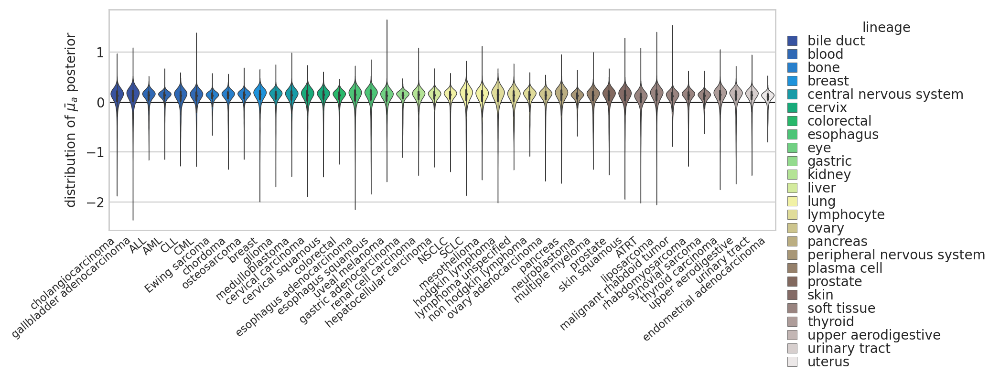

In [14]:
_, ax = plt.subplots(figsize=(9, 3))
ax.axhline(0, color="k", lw=0.7, zorder=1)
sns.violinplot(
    data=mu_a_post_df,
    x="lineage_subtype",
    y="mean",
    hue="lineage",
    palette=lineage_pal,
    dodge=False,
    linewidth=0.5,
    ax=ax,
)
xlbls = [axis_labels_to_sublineage(lbl) for lbl in ax.get_xticklabels()]
ax.set_xticklabels(xlbls, rotation=40, ha="right", size=8)
ax.legend(
    loc="upper left",
    bbox_to_anchor=(1, 1),
    title="lineage",
    handlelength=0.7,
    handleheight=0.7,
    labelspacing=0,
)
ax.set_xlabel(None)
ax.set_ylabel(r"distribution of $\bar{\mu}_a$ posterior")
plt.show()

number of genes: 3624


/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


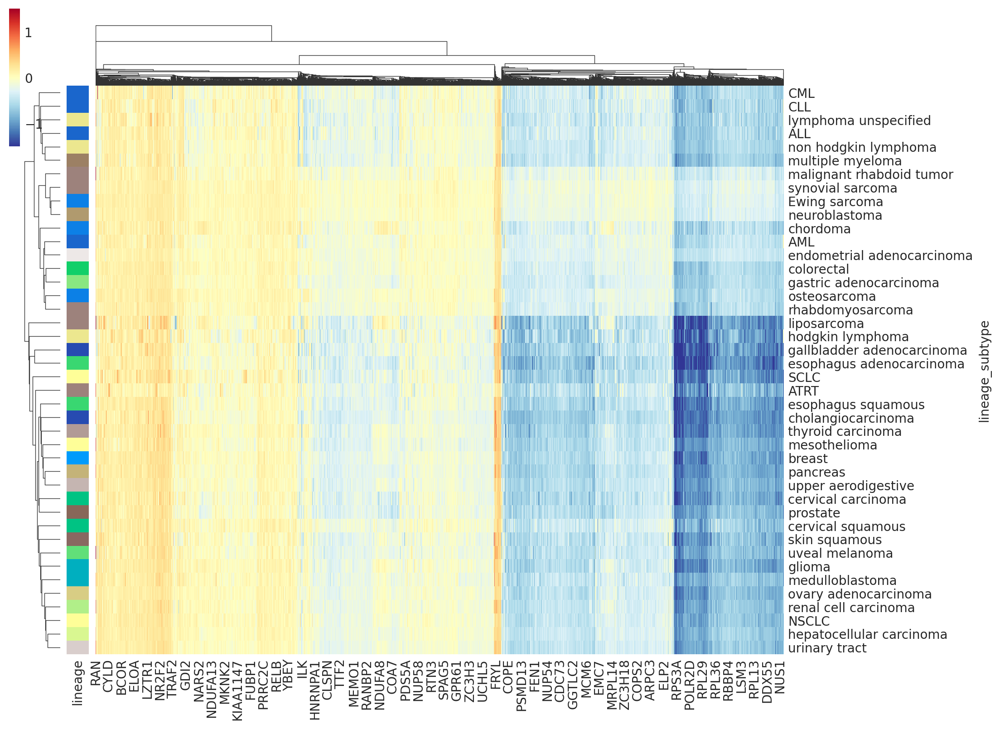

In [15]:
mu_a_post_X = mu_a_post_df.pivot_wider(
    "lineage_subtype", names_from="hugo_symbol", values_from="mean"
).set_index("lineage_subtype")

# Top 80% most variable genes.
variances = mu_a_post_X.var(axis=0)
mu_a_post_X = mu_a_post_X.loc[:, np.quantile(variances, q=0.8) < variances]
print(f"number of genes: {mu_a_post_X.shape[1]}")


# Row color dictionary.
row_colors = (
    pd.DataFrame({"index": mu_a_post_X.index})
    .assign(lineage=lambda d: d["index"].map(sub_to_lineage).map(lineage_pal))
    .set_index("index")
)

# Clustermap.
cg = sns.clustermap(
    mu_a_post_X,
    figsize=(12, 8),
    dendrogram_ratio=(0.05, 0.1),
    row_colors=row_colors,
    cmap="RdYlBu_r",
    center=0,
    vmin=-1.5,
    vmax=1.5,
    yticklabels=1,
    cbar_pos=(0, 0.81, 0.01, 0.19),
)
ylbls = [axis_labels_to_sublineage(lbl) for lbl in cg.ax_heatmap.get_yticklabels()]
cg.ax_heatmap.set_yticklabels(ylbls)
plt.show()

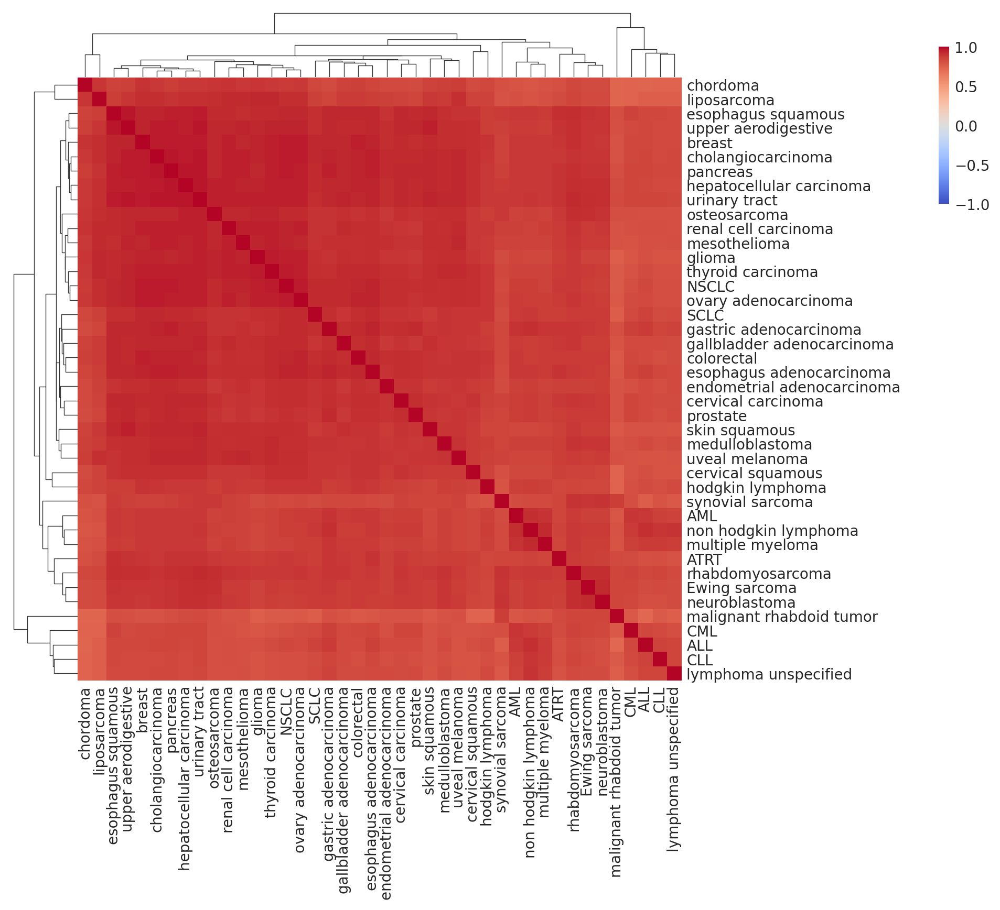

In [16]:
mu_a_corr = mu_a_post_X.T.corr()
mu_a_corr.to_csv(OUTPUT_DIR / "mu_a-variable-correlations.csv")
mu_a_corr.head()

cg = sns.clustermap(
    mu_a_corr,
    cmap="coolwarm",
    vmax=1,
    vmin=-1,
    center=0,
    figsize=(10, 10),
    dendrogram_ratio=(0.1, 0.1),
    cbar_pos=(0.9, 0.8, 0.01, 0.15),
)
cg.ax_heatmap.set_xlabel(None)
cg.ax_heatmap.set_ylabel(None)
ylbls = [axis_labels_to_sublineage(lbl) for lbl in cg.ax_heatmap.get_yticklabels()]
cg.ax_heatmap.set_yticklabels(ylbls)
xlbls = [axis_labels_to_sublineage(lbl) for lbl in cg.ax_heatmap.get_xticklabels()]
cg.ax_heatmap.set_xticklabels(xlbls)
plt.show()

#### Enrichment analysis of top intercept genes

In [17]:
head_mu_a = (
    mu_a_post_df.sort_values(["lineage_subtype", "mean"], ascending=(True, False))
    .groupby("lineage_subtype")
    .head(100)
    .reset_index(drop=True)
)
tail_mu_a = (
    mu_a_post_df.sort_values(["lineage_subtype", "mean"], ascending=(True, False))
    .groupby("lineage_subtype")
    .tail(100)
    .reset_index(drop=True)
)

In [18]:
def ssgsea(df: pd.DataFrame, stash: bool = True) -> pd.DataFrame:
    X = df.pivot_wider(
        "hugo_symbol", names_from="lineage_subtype", values_from="mean"
    ).set_index("hugo_symbol")

    stash_fp = STASH_DIR / "ssgsea-mu-a-posterior.csv"
    if stash and stash_fp.exists():
        return pd.read_csv(stash_fp)

    ss_res = gp.ssgsea(data=X, gene_sets=GENE_SETS).res2d.clean_names()
    ss_res.to_csv(stash_fp, index=False)
    return ss_res


def post_ssgsea(ssgsea_res: pd.DataFrame) -> pd.DataFrame:
    return (
        ssgsea_res.rename(columns={"term": "geneset_term", "name": "lineage_subtype"})
        .assign(
            gene_set=lambda d: [t.split("__")[0] for t in d["geneset_term"]],
            term=lambda d: [t.split("__")[1] for t in d["geneset_term"]],
        )
        .rename(columns={"tag_%": "tag_perc", "gene_%": "gene_perc"})
    )

In [19]:
GENE_SETS = [
    "KEGG_2021_Human",
    "MSigDB_Hallmark_2020",
    "MSigDB_Oncogenic_Signatures",
]


def enrichr(df: pd.DataFrame, stash: bool = True) -> pd.DataFrame:
    genes = list(df["hugo_symbol"].toset())
    genes.sort()
    genes_hash = str_hash("__".join(genes))
    stash_fp = STASH_DIR / f"enrichr-{genes_hash}.csv"
    if stash and stash_fp.exists():
        return pd.read_csv(stash_fp)

    enr = gp.enrichr(
        gene_list=genes,
        gene_sets=GENE_SETS,
        organism="human",
        outdir=None,
        cutoff=1,
        top_term=int(1e6),
    )
    res = enr.results.clean_names()
    res.to_csv(stash_fp, index=False)
    return res


def enrichr_post(res_df: pd.DataFrame) -> pd.DataFrame:
    return res_df.assign(
        overlap_frac=lambda d: [float(Fraction(x)) for x in d["overlap"]],
        n_overlap=lambda d: [int(x.split("/")[0]) for x in d["overlap"]],
    )

In [20]:
enrichr_res_up = (
    head_mu_a.groupby("lineage_subtype")
    .apply(enrichr, stash=True)
    .reset_index(drop=False)
    .assign(lineage=lambda d: d["lineage_subtype"].map(sub_to_lineage))
    .drop(columns=["level_1"])
    .pipe(enrichr_post)
)
enrichr_res_dn = (
    tail_mu_a.groupby("lineage_subtype")
    .apply(enrichr, stash=True)
    .reset_index(drop=False)
    .assign(lineage=lambda d: d["lineage_subtype"].map(sub_to_lineage))
    .drop(columns=["level_1"])
    .pipe(enrichr_post)
)

In [21]:
enrichr_res_up.head(3)

,lineage_subtype,gene_set,term,overlap,p_value,adjusted_p_value,old_p_value,old_adjusted_p_value,odds_ratio,combined_score,genes,lineage,overlap_frac,n_overlap
0,bile duct (cholangiocarcinoma),KEGG_2021_Human,Human T-cell leukemia virus 1 infection,9/219,0.000002,0.000142,0,0,9.273155,124.100639,MAPK9;CDKN1A;CDKN2C;CHEK2;PTEN;ATM;TP53;ETS1;C...,bile duct,0.041096,9
1,bile duct (cholangiocarcinoma),KEGG_2021_Human,p53 signaling pathway,6/73,0.000002,0.000142,0,0,18.894570,250.533811,CDKN1A;CHEK2;PTEN;PMAIP1;ATM;TP53,bile duct,0.082192,6
2,bile duct (cholangiocarcinoma),KEGG_2021_Human,Cellular senescence,7/156,0.000013,0.000727,0,0,9.977412,111.959280,HIPK4;CDKN1A;CHEK2;PTEN;ATM;TP53;ETS1,bile duct,0.044872,7


In [22]:
enrichr_res_up["term"].nunique(), enrichr_res_dn["term"].nunique()

(539, 354)

In [23]:
enrichr_res_up["gene_set"].unique()

array(['KEGG_2021_Human', 'MSigDB_Hallmark_2020',
       'MSigDB_Oncogenic_Signatures'], dtype=object)

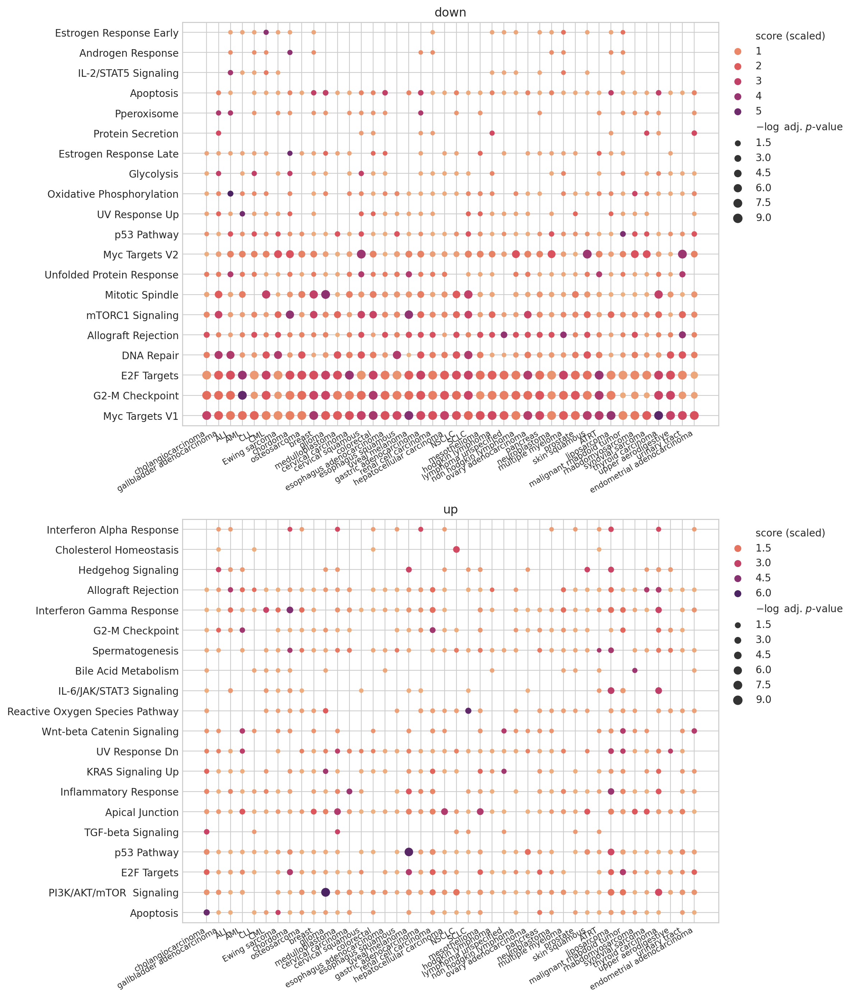

In [24]:
def grouped_zscore(df: pd.DataFrame, grp_cols: list[str], value: str) -> pd.DataFrame:
    def f(_df: pd.DataFrame) -> pd.DataFrame:
        x = _df[value]
        _df[value] = x / np.std(x)
        return _df

    return df.groupby(grp_cols).apply(f)


plot_df = (
    pd.concat(
        [enrichr_res_up.assign(direction="up"), enrichr_res_dn.assign(direction="down")]
    )
    .query("gene_set == 'MSigDB_Hallmark_2020'")
    .reset_index(drop=True)
)
fig, axes = plt.subplots(nrows=2, figsize=(12, 14))

for ax, (direction, df) in zip(axes, plot_df.groupby("direction")):
    term_variances = df.groupby("term")["combined_score"].var()
    term_variances = term_variances[~np.isnan(term_variances)]
    q = np.quantile(term_variances, 1 - (20 / len(term_variances)))
    top_var_terms = list(term_variances[q <= term_variances].index)

    df = (
        df.copy()
        .filter_column_isin("term", top_var_terms)
        .assign(
            adjusted_p_value=lambda d: squish_array(
                d["adjusted_p_value"], lower=10e-5, upper=1
            )
        )
        .assign(neg_log_adj_p_val=lambda d: -np.log(d["adjusted_p_value"]))
        .pipe(grouped_zscore, grp_cols=["term"], value="combined_score")
        .rename(
            columns={
                "neg_log_adj_p_val": r"$-\log$ adj. $p$-value",
                "overlap_frac": "overlap frac.",
                "combined_score": "score (scaled)",
            }
        )
    )

    ax.set_title(direction)
    sns.scatterplot(
        data=df,
        x="lineage_subtype",
        y="term",
        hue="score (scaled)",
        size=r"$-\log$ adj. $p$-value",
        ax=ax,
        palette="flare",
        edgecolor=None,
    )
    ax.legend(loc="upper left", bbox_to_anchor=(1, 1))
    ax.set_xlabel(None)
    ax.set_ylabel(None)

    xlbls = [extract_sublineage(lbl) for lbl in sorted(df["lineage_subtype"].unique())]
    ax.set_xticks(
        ticks=np.arange(len(xlbls)), labels=xlbls, rotation=30, ha="right", size=8
    )
    ax.set_ylim(-0.5, df["term"].nunique() - 0.5)

fig.tight_layout()
plt.show()

In [25]:
ssgsea_res = (
    ssgsea(mu_a_post_df.copy())
    .pipe(post_ssgsea)
    .assign(lineage=lambda d: d["lineage_subtype"].map(sub_to_lineage))
)

In [26]:
ssgsea_res.head(3)

,lineage_subtype,geneset_term,es,nes,tag_perc,gene_perc,lead_genes,gene_set,term,lineage
0,blood (ALL),KEGG_2021_Human__Aminoacyl-tRNA biosynthesis,-7917.759220,-0.642896,25/66,21.06%,YARS2;FARSB;ACTR2;SEPSECS;SARS2;CARS2;RARS2;LE...,KEGG_2021_Human,Aminoacyl-tRNA biosynthesis,blood
1,gastric (gastric adenocarcinoma),KEGG_2021_Human__Ribosome,-7851.762747,-0.637538,126/158,14.39%,RPL12;RPS4X;POLR2L;RPSA;RPS6;RPL7A;DONSON;RPL9...,KEGG_2021_Human,Ribosome,gastric
2,prostate,KEGG_2021_Human__Aminoacyl-tRNA biosynthesis,-7810.956760,-0.634224,25/66,14.39%,BUB3;RUVBL2;MIS18A;AARS2;MARS2;TARS2;COPS8;NUD...,KEGG_2021_Human,Aminoacyl-tRNA biosynthesis,prostate


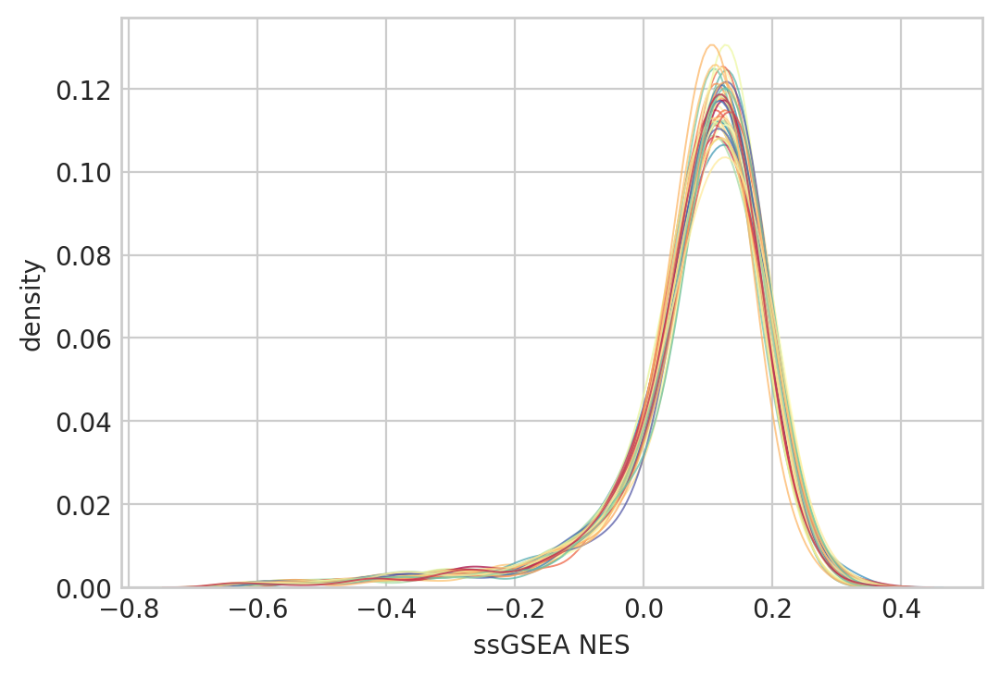

In [27]:
_, ax = plt.subplots(figsize=(6, 4))
sns.kdeplot(
    data=ssgsea_res,
    x="nes",
    hue="lineage_subtype",
    ax=ax,
    palette=sublineage_pal,
    lw=0.7,
    alpha=0.75,
)

pal = {
    k: v for k, v in sublineage_pal.items() if k in set(ssgsea_res["lineage_subtype"])
}

ax.get_legend().remove()
ax.set_xlabel("ssGSEA NES")
ax.set_ylabel("density")
plt.show()

### RNA covariate $b$

In [28]:
def get_rna_effect_summary(pm: PostDataMan, stash: bool = True) -> pd.DataFrame:
    try:
        return (
            get_variables_summary(pm, var_names=["b"], stash=stash)
            .pipe(extract_coords_param_names, col="parameter", names=["hugo_symbol"])
            .drop(columns=["parameter"])
        )
    except FileNotFoundError:
        print(f"Skipping {pm.id}.")
        return pd.DataFrame()


rna_post = (
    pd.concat([get_rna_effect_summary(pm) for pm in postmen.posteriors])
    .reset_index(drop=True)
    .pipe(assign_lineage, mapping=sub_to_lineage)
)
rna_post.to_csv(OUTPUT_DIR / "rna-posterior-summary.csv", index=False)
rna_post.head(3)

Skipping skin (melanoma).


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,lineage_subtype,hugo_symbol,lineage
0,-0.002,0.029,-0.049,0.045,0.0,0.001,8983.0,2342.0,1.0,b,bile duct (cholangiocarcinoma),A1BG,bile duct
1,0.032,0.029,-0.011,0.082,0.0,0.000,10585.0,2707.0,1.0,b,bile duct (cholangiocarcinoma),A1CF,bile duct
2,0.032,0.031,-0.018,0.079,0.0,0.000,11338.0,2856.0,1.0,b,bile duct (cholangiocarcinoma),A2M,bile duct


/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


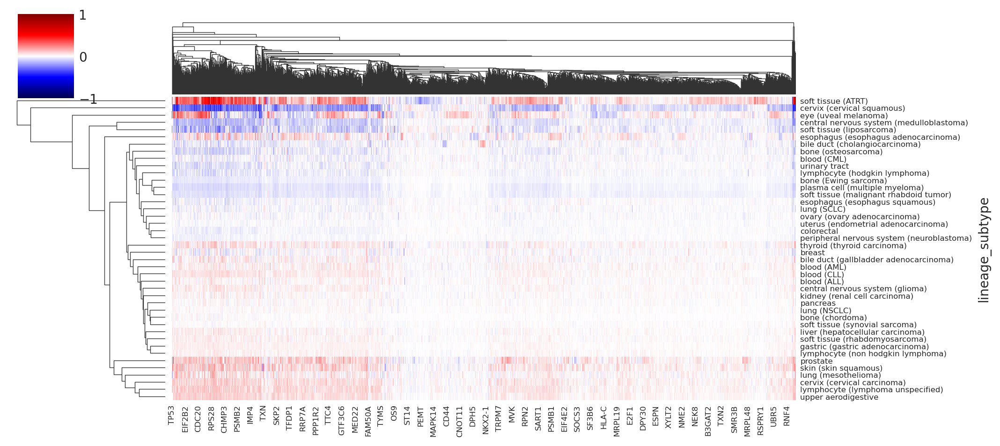

In [29]:
rna_post_X = rna_post.pivot_wider(
    "lineage_subtype", names_from="hugo_symbol", values_from="mean"
).set_index("lineage_subtype")

gene_rna_var = rna_post_X.var(axis=0)
top_var_rna = gene_rna_var[np.quantile(gene_rna_var.values, 0.8) < gene_rna_var]

rna_post_X_topvar = rna_post_X.copy()[top_var_rna.index.tolist()]

cg = sns.clustermap(
    rna_post_X_topvar,
    figsize=(12, 5),
    cmap="seismic",
    center=0,
    vmax=1,
    vmin=-1,
    yticklabels=1,
)
cg.ax_heatmap.tick_params(labelsize=6)
plt.show()

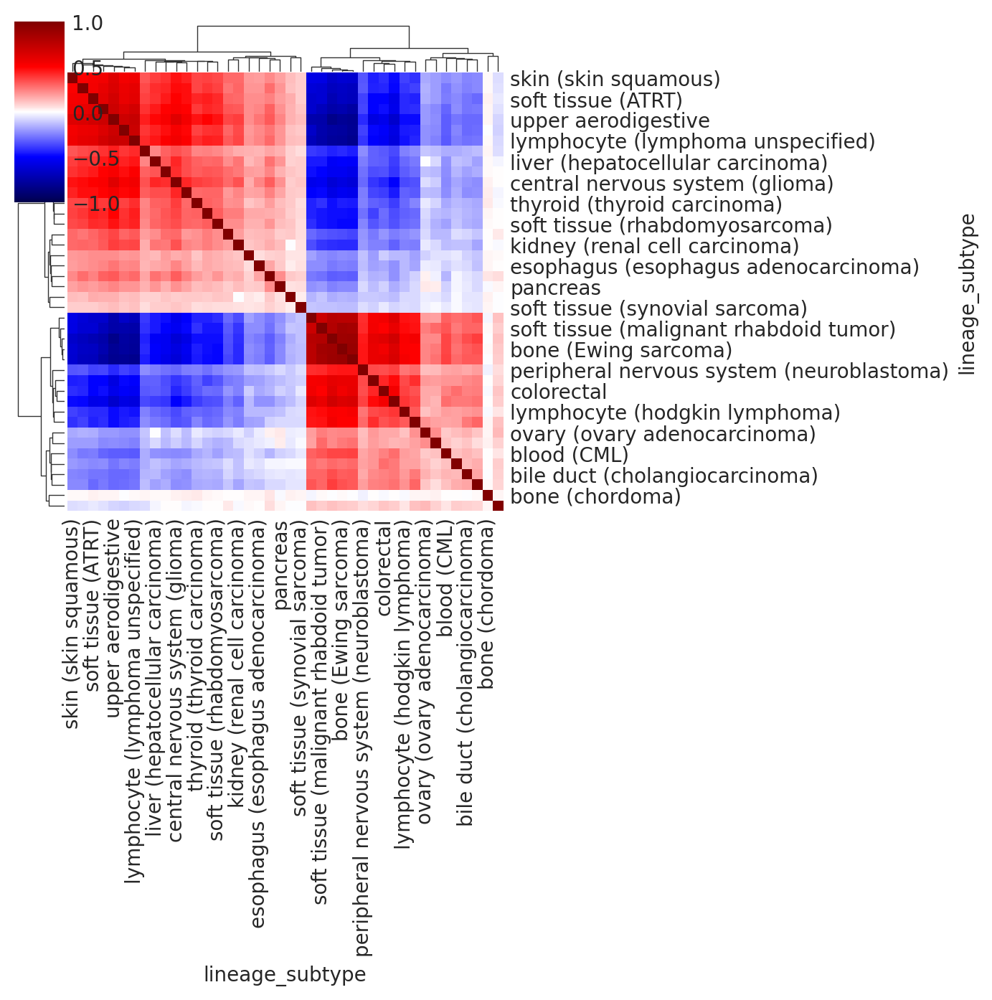

In [30]:
rna_corr = rna_post_X.T.corr()
cg = sns.clustermap(
    rna_corr,
    figsize=(7, 7),
    dendrogram_ratio=(0.1, 0.1),
    cmap="seismic",
    center=0,
    vmin=-1,
    vmax=1,
)
rna_corr.to_csv(OUTPUT_DIR / "rna-variable-correlations.csv")
plt.show()

In [31]:
print(f"number top variable genes: {len(top_var_rna)}")

stash_fp = STASH_DIR / "enrichr-top-var-rna-effect-genes.csv"
if stash_fp.exists():
    enrichr_res = pd.read_csv(stash_fp)
else:
    enrichr_res = gp.enrichr(
        gene_list=list(top_var_rna.index),
        gene_sets=["KEGG_2021_Human", "MSigDB_Hallmark_2020"],
    ).results.clean_names()
    enrichr_res.to_csv(stash_fp, index=False)

enrichr_res.to_csv(OUTPUT_DIR / "variable-rna-effect-top-var.csv", index=False)
enrichr_res.head()

number top variable genes: 3624


,gene_set,term,overlap,p_value,adjusted_p_value,old_p_value,old_adjusted_p_value,odds_ratio,combined_score,genes
0,KEGG_2021_Human,Ribosome,114/158,2.596783e-83,6.881476e-81,0,0,27.685191,5264.623952,RPL4;RPL5;RPL3;RPL32;RPL31;RPL34;RPL8;RPL10A;R...
1,KEGG_2021_Human,Spliceosome,100/150,9.450310e-68,1.252166e-65,0,0,21.189252,3270.131777,EIF4A3;HNRNPU;EFTUD2;SNRPD2;SNRPD1;MAGOH;SNRPD...
2,KEGG_2021_Human,RNA transport,98/186,9.314184e-53,8.227529e-51,0,0,11.760104,1408.924800,POP5;EIF4A1;POP7;NUP107;POP1;POP4;RPP30;EIF4A3...
3,KEGG_2021_Human,Amyotrophic lateral sclerosis,123/364,3.495920e-40,2.316047e-38,0,0,5.423133,492.701463,NUP107;NDUFA10;ACTB;PSMD8;PSMD6;PSMD7;PSMD4;PS...
4,KEGG_2021_Human,Cell cycle,66/124,3.100069e-36,1.643036e-34,0,0,11.815973,966.093356,RB1;CDKN1A;MCM7;CCNH;BUB1B;SMC3;CDC20;CDC23;CC...


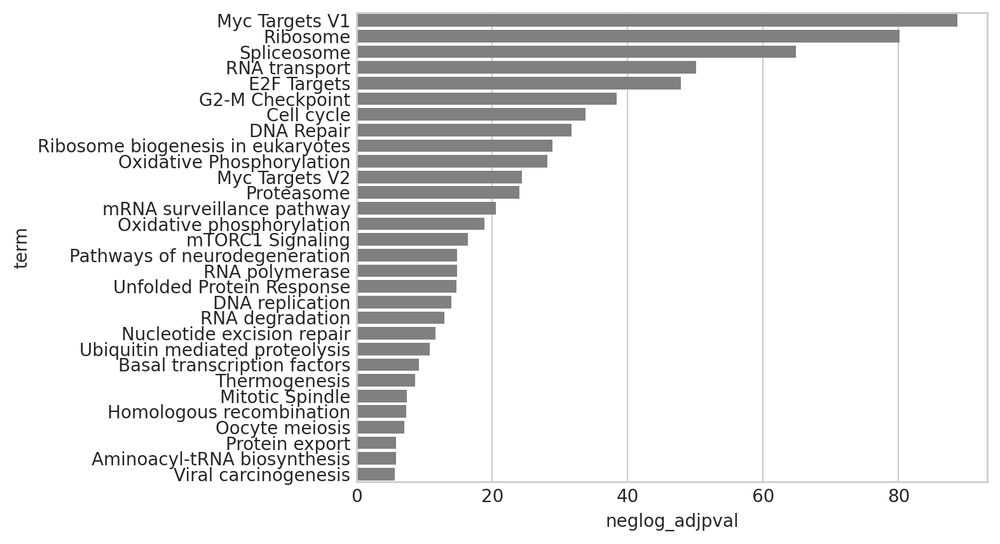

In [32]:
df = (
    enrichr_res.sort_values("adjusted_p_value")
    .assign(neglog_adjpval=lambda d: -np.log10(d["adjusted_p_value"]))
    .query("adjusted_p_value < 0.01")
)
rm_terms = ["disease", "sclerosis", "ataxia", "Diabetic"]
for rm_term in rm_terms:
    df = df.filter_string("term", rm_term, complement=True)

sns.barplot(data=df.head(30), x="neglog_adjpval", y="term", color="grey")
plt.show()

#### Visualization of RNA effect against observed data

num genes: 62


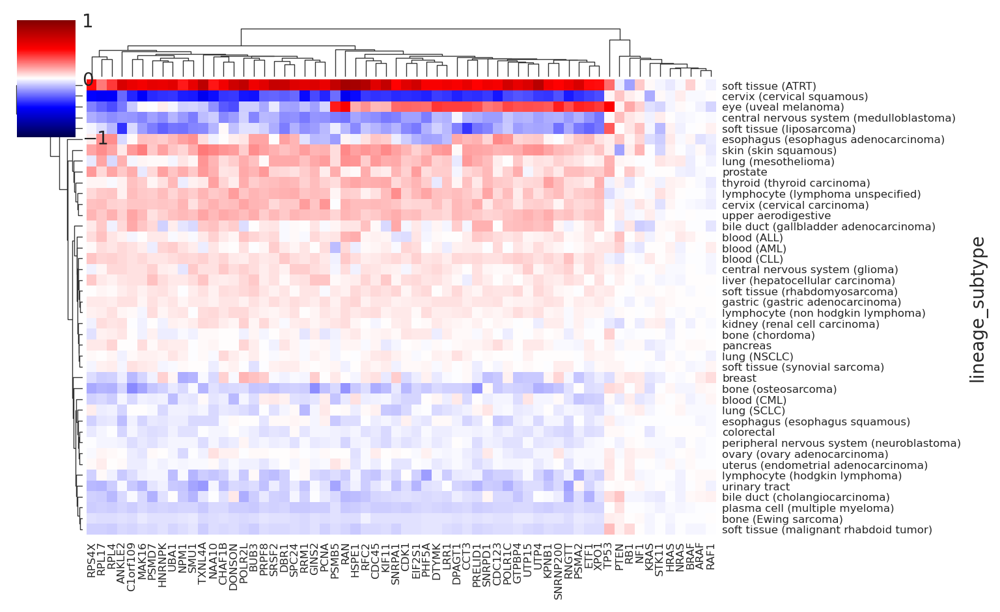

In [33]:
_top_var_genes = list(gene_rna_var.sort_values(ascending=False).head(50).index)
rna_comparison_genes = _top_var_genes + [
    "TP53",
    "KRAS",
    "NRAS",
    "HRAS",
    "BRAF",
    "NPM1",
    "PTEN",
    "NF1",
    "ARAF",
    "RAF1",
    "STK11",
    "RB1",
]
rna_comparison_genes = list(set(rna_comparison_genes))
rna_comparison_genes.sort()
print(f"num genes: {len(rna_comparison_genes)}")

cg = sns.clustermap(
    rna_post_X[rna_comparison_genes],
    figsize=(9, 5),
    cmap="seismic",
    center=0,
    vmax=1,
    vmin=-1,
    xticklabels=1,
    yticklabels=1,
    dendrogram_ratio=(0.1, 0.1),
)
cg.ax_heatmap.tick_params(labelsize=6)
plt.show()

In [34]:
rna_post[["lineage_subtype"]].drop_duplicates().filter_string(
    "lineage_subtype", "cervix"
)

,lineage_subtype
217428,cervix (cervical carcinoma)
235547,cervix (cervical squamous)


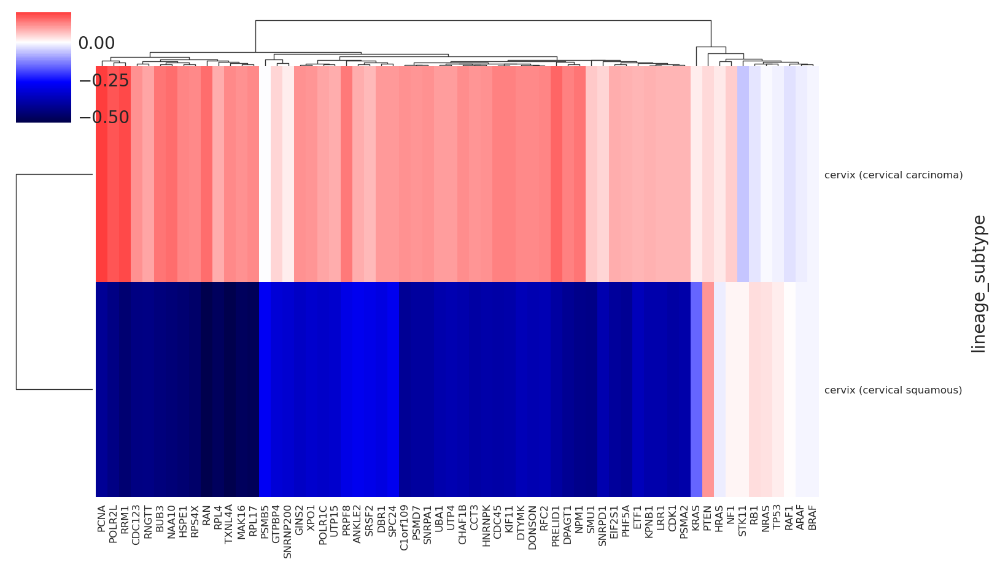

In [35]:
cg = sns.clustermap(
    rna_post_X.loc[
        ["cervix (cervical carcinoma)", "cervix (cervical squamous)"],
        rna_comparison_genes,
    ],
    figsize=(9, 5),
    cmap="seismic",
    center=0,
    # vmax=1,
    # vmin=-1,
    xticklabels=1,
    yticklabels=1,
    dendrogram_ratio=(0.1, 0.1),
)
cg.ax_heatmap.tick_params(labelsize=6)
plt.show()

In [36]:
def get_validated_gene_data(
    pm: PostDataMan, genes: list[str], stash: bool = True
) -> pd.DataFrame:
    _genes_hash = str_hash("__".join(sorted(genes)))
    stash_fp = STASH_DIR / f"gene-data_{_genes_hash}_{pm.id}.csv"

    csv_kwargs = {
        "low_memory": False,
        "dtype": {
            "age": "float64",
            "p_dna_batch": "object",
            "primary_or_metastasis": "object",
            "rna_expr": "float",
            "counts_final": "float64",
        },
    }
    if stash and stash_fp.exists():
        return pd.read_csv(stash_fp, **csv_kwargs)

    data = (
        dd.read_csv(pm.data_file, **csv_kwargs)
        .query("hugo_symbol in @genes", local_dict={"genes": genes})
        .compute()
        .reset_index(drop=True)
        .pipe(pm.validate_data)
    )

    data.to_csv(stash_fp, index=False)
    return data

In [37]:
set_console_handler_level("ERROR")
genes_data = (
    pd.concat(
        [get_validated_gene_data(pm, rna_comparison_genes) for pm in postmen.posteriors]
    )
    .reset_index(drop=True)
    .drop(columns=["lineage_subtype"])
    .rename(columns={"lineage": "lineage_subtype"})
    .assign(
        lineage_subtype=lambda d: [x.replace("_", " ") for x in d["lineage_subtype"]]
    )
    .pipe(assign_lineage, mapping=sub_to_lineage)
)
genes_data.to_csv(OUTPUT_DIR / "specific-gene-data.csv", index=False)
genes_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,z_rna_gene,m_rna_gene,cn_gene,cn_cell_line,counts_final_total,counts_initial_total,counts_final_rpm,counts_initial_adj,cell_chrom,lineage
0,AAGAACGGAACACAGGTCCA,SNU869-311Cas9_RepA_p4_batch3,-3.153218,3,chr18_21622784_+,SNRPD1,broad,False,18,21622784,...,-2.192217,-2.192217,-0.332632,-0.501718,34199190,1.071751e+06,1.000000,255.684116,ACH-000182__18,bile duct
1,AATCAACCCACAGCTGCACA,SNU869-311Cas9_RepA_p4_batch3,0.048742,3,chr17_7675183_+,TP53,broad,False,17,7675183,...,-0.241421,-0.241421,-0.233073,-0.497916,34199190,1.071751e+06,29.597169,782.097377,ACH-000182__17,bile duct
2,AATCAGACTAGAAAGTGAAG,SNU869-311Cas9_RepA_p4_batch3,-2.082598,3,chr10_60784785_+,CDK1,broad,False,10,60784785,...,0.126548,0.126548,0.004395,0.002008,34199190,1.071751e+06,2.725187,322.567261,ACH-000182__10,bile duct
3,AATCCAGCAGCACAATGCGA,SNU869-311Cas9_RepA_p4_batch3,-2.744204,3,chr1_156318916_+,CCT3,broad,False,1,156318916,...,-0.583706,-0.583706,-0.110078,-0.008430,34199190,1.071751e+06,3.163794,590.441480,ACH-000182__1,bile duct
4,AATCCATGTACTGACCAGGA,SNU869-311Cas9_RepA_p4_batch3,-3.206978,3,chr10_60785756_-,CDK1,broad,False,10,60785756,...,0.126548,0.126548,0.004395,0.002008,34199190,1.071751e+06,1.000000,277.550760,ACH-000182__10,bile duct


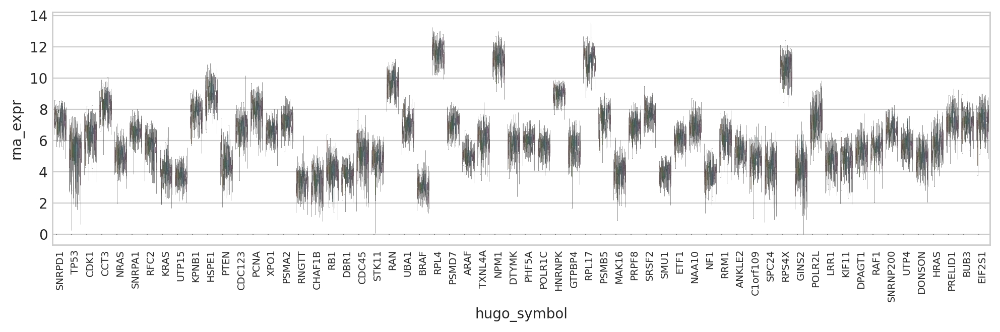

In [38]:
plot_df = (
    genes_data.copy()[["depmap_id", "hugo_symbol", "lineage_subtype", "rna_expr"]]
    .drop_duplicates()
    .reset_index(drop=True)
)
_, ax = plt.subplots(figsize=(12, 3))
sns.boxplot(
    data=plot_df,
    x="hugo_symbol",
    y="rna_expr",
    hue="lineage_subtype",
    dodge=True,
    linewidth=0.2,
    showfliers=False,
    ax=ax,
)
ax.get_legend().remove()
ax.tick_params("x", rotation=90, labelsize=7)

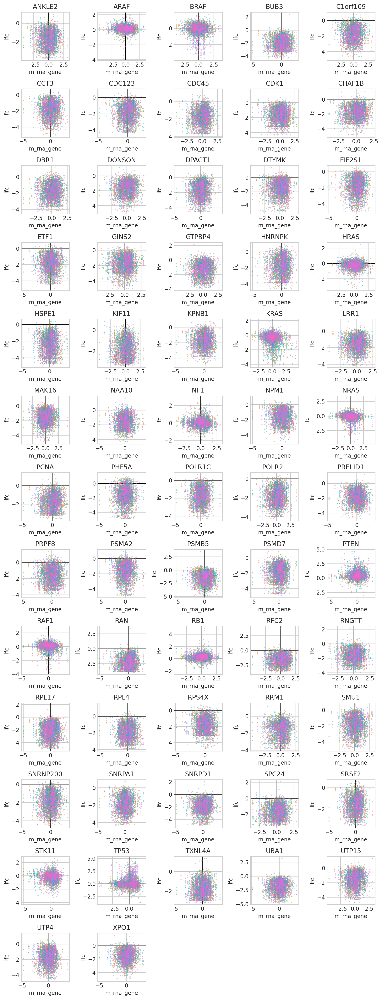

In [39]:
_genes = sorted(list(genes_data["hugo_symbol"].unique()))
ncols = 5
nrows = ceil(len(_genes) / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 2, nrows * 2))

for ax, gene in zip(axes.flatten(), _genes):
    ax.set_title(gene)
    df = genes_data.query(f"hugo_symbol == '{gene}'").reset_index(drop=True)
    ax.axhline(0, c="k", lw=0.5, zorder=1)
    ax.axvline(0, c="k", lw=0.5, zorder=1)
    sns.scatterplot(
        data=df,
        x="m_rna_gene",
        y="lfc",
        hue="lineage",
        ax=ax,
        edgecolor=None,
        s=3,
        alpha=0.5,
        legend=False,
        zorder=10,
    )
for ax in axes.flatten()[len(_genes) :]:
    ax.axis("off")
fig.tight_layout()
plt.show()

In [40]:
def get_posterior_mu_for_gene_rna(
    pm: PostDataMan, gene: str, x_rna: np.ndarray, stash: bool = True
) -> pd.DataFrame:
    x_rna_str = f"{x_rna.mean():0.4f}_{x_rna.std():0.4f}_{len(x_rna)}_{x_rna.dtype}"
    x_rna_hash = str_hash(x_rna_str)
    stash_fp = STASH_DIR / f"mu-across-rna_{pm.id}_{gene}_{x_rna_hash}.csv"
    if stash and stash_fp.exists():
        return pd.read_csv(stash_fp)

    try:
        trace = pm.trace
    except AssertionError:
        print(f"Skipping {pm.id}.")
        return pd.DataFrame()

    post = trace.posterior
    mu = post.get("mu_a").sel(gene=[gene]).values + (
        post.get("b").sel(gene=[gene]).values * x_rna
    )
    mu_mean = mu.mean(axis=(0, 1))
    mu_hdi = az.hdi(mu)
    res = pd.DataFrame(
        {
            "mu_mean": mu_mean,
            "mu_hdi_low": mu_hdi[:, 0],
            "mu_hdi_high": mu_hdi[:, 1],
            "x_rna": x_rna,
            "lineage_subtype": pm.id,
            "hugo_symbol": gene,
        }
    )
    res.to_csv(stash_fp, index=False)
    return res


GENES = ["MAK16", "NPM1", "KRAS", "KIF11", "SNRPA1", "NF1", "PCNA"]
genes_mu_dfs = pd.DataFrame()
for G in GENES:
    df = genes_data.query(f"hugo_symbol == '{G}'").reset_index(drop=True)
    _rna = df["m_rna_gene"].values
    rna_min, rna_max = _rna.min(), _rna.max()
    rna_min -= np.abs(0.05 * rna_min)
    rna_max += 0.05 * rna_max
    x_rna = np.linspace(rna_min, rna_max, 1000)

    _df = pd.concat(
        [
            get_posterior_mu_for_gene_rna(pm, gene=G, x_rna=x_rna)
            for pm in postmen.posteriors
        ]
    )
    genes_mu_dfs = pd.concat([genes_mu_dfs, _df])

genes_mu_dfs = genes_mu_dfs.reset_index(drop=True)
genes_mu_dfs.to_csv(OUTPUT_DIR / "computed-rna-expression-effect.csv", index=False)
genes_mu_dfs.head(3)

Skipping skin (melanoma).
Skipping skin (melanoma).
Skipping skin (melanoma).
Skipping skin (melanoma).
Skipping skin (melanoma).
Skipping skin (melanoma).
Skipping skin (melanoma).


,mu_mean,mu_hdi_low,mu_hdi_high,x_rna,lineage_subtype,hugo_symbol
0,-0.788146,-1.046227,-0.486392,-4.467267,bile duct (cholangiocarcinoma),MAK16
1,-0.788809,-1.049067,-0.489957,-4.458395,bile duct (cholangiocarcinoma),MAK16
2,-0.789473,-1.046378,-0.487782,-4.449524,bile duct (cholangiocarcinoma),MAK16


In [41]:
T = TypeVar("T")


def _tidy_pal_labels(pal: dict[str, T]) -> dict[str, T]:
    new_pal = {}
    for k, v in pal.items():
        if "(" in k:
            k = k.split("(")[1].replace(")", "").strip()
        new_pal[k] = v
    return new_pal


def plot_prediction_over_rna(
    gene: str,
    lineages: list[str],
    obs_data: pd.DataFrame,
    pred_data: pd.DataFrame,
    ax: plt.Axes | None = None,
) -> None:
    obs_df = (
        obs_data.copy()
        .query(f"hugo_symbol == '{gene}'")
        .filter_column_isin("lineage_subtype", lineages)
        .reset_index(drop=True)
    )
    pred_df = (
        pred_data.query(f"hugo_symbol == '{gene}'")
        .filter_column_isin("lineage_subtype", lineages)
        .reset_index(drop=True)
    )
    colors = sns.color_palette("Set1", len(lineages))
    pal = {ln: c for ln, c in zip(lineages, colors)}

    xmin, xmax = obs_df["m_rna_gene"].min(), obs_df["m_rna_gene"].max()
    xmin -= np.abs(0.05 * xmin)
    xmax += 0.05 * xmax

    ymin, ymax = obs_df["lfc"].min(), obs_df["lfc"].max()
    ymin -= np.abs(0.05 * ymin)
    ymax += 0.05 * ymax

    if ax is None:
        _, ax = plt.subplots(figsize=(3, 3))

    sns.scatterplot(
        data=obs_df,
        x="m_rna_gene",
        y="lfc",
        hue="lineage_subtype",
        palette=pal,
        alpha=0.5,
        s=15,
        zorder=5,
        ax=ax,
    )
    sns.rugplot(
        data=obs_df,
        x="m_rna_gene",
        y="lfc",
        hue="lineage_subtype",
        palette=pal,
        alpha=0.5,
        ax=ax,
        height=-0.02,
        clip_on=False,
    )

    ax.set_title(f"${gene}$")
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_ylabel("LFC")
    ax.set_xlabel("mRNA (m-scaled)")

    ax.get_legend().remove()
    ax.legend(
        handles=pal_to_legend_handles(
            _tidy_pal_labels(pal), lw=0, marker="o", markersize=3
        ),
        loc="upper left",
        bbox_to_anchor=(1, 1),
        title="lineage",
        handletextpad=0.5,
        handlelength=0,
    )

    for lineage in lineages:
        df = pred_df.query(f"lineage_subtype == '{lineage}'")
        ax.fill_between(
            x=df["x_rna"],
            y1=df["mu_hdi_low"],
            y2=df["mu_hdi_high"],
            alpha=0.25,
            color=pal[lineage],
            lw=0,
            zorder=10,
        )
        ax.plot(df["x_rna"], df["mu_mean"], zorder=15, c=pal[lineage])

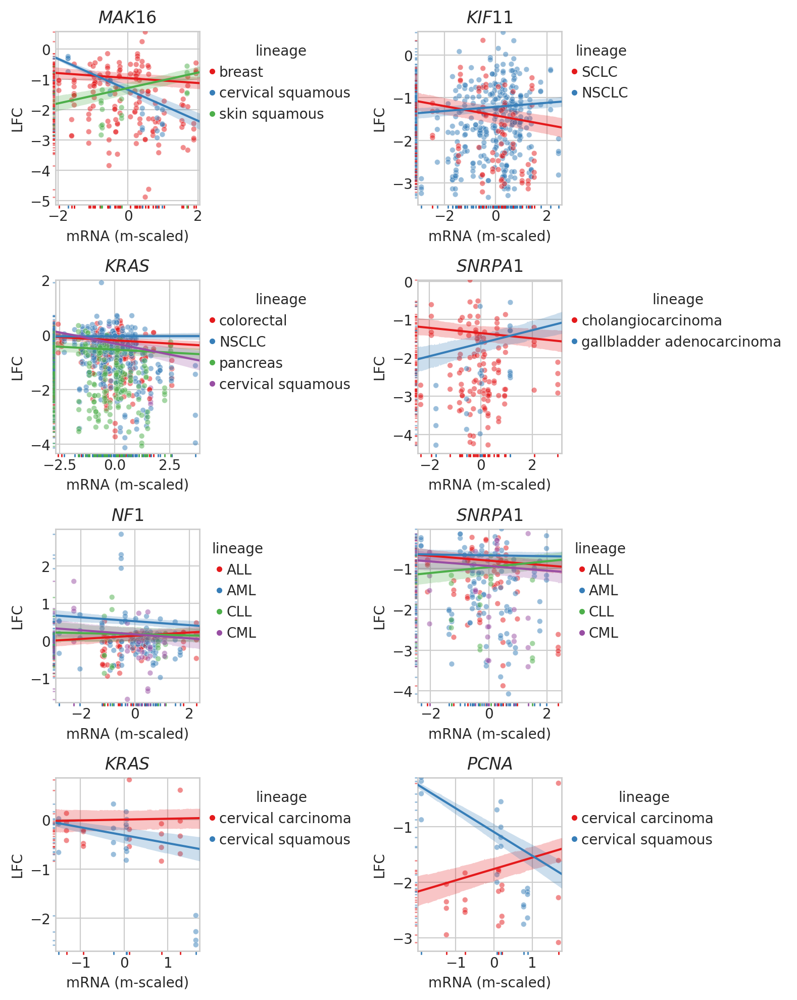

In [42]:
rna_plots: list[tuple[str, list[str]]] = [
    ("MAK16", ["breast", "cervix (cervical squamous)", "skin (skin squamous)"]),
    ("KIF11", ["lung (SCLC)", "lung (NSCLC)"]),
    ("KRAS", ["colorectal", "lung (NSCLC)", "pancreas", "cervix (cervical squamous)"]),
    (
        "SNRPA1",
        ["bile duct (cholangiocarcinoma)", "bile duct (gallbladder adenocarcinoma)"],
    ),
    ("NF1", ["blood (ALL)", "blood (AML)", "blood (CLL)", "blood (CML)"]),
    ("SNRPA1", ["blood (ALL)", "blood (AML)", "blood (CLL)", "blood (CML)"]),
    ("KRAS", ["cervix (cervical carcinoma)", "cervix (cervical squamous)"]),
    ("PCNA", ["cervix (cervical carcinoma)", "cervix (cervical squamous)"]),
]

ncols = 2
nrows = ceil(len(rna_plots) / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 4, nrows * 2.5))
for ax, (gene, lineages) in zip(axes.flatten(), rna_plots):
    plot_prediction_over_rna(
        gene=gene, lineages=lineages, obs_data=genes_data, pred_data=genes_mu_dfs, ax=ax
    )
plt.tight_layout()
plt.show()

### sgRNA variance

In [44]:
sgrna_info = get_sgrna_to_gene_map()
sgrna_info.head(3)

,sgrna,hugo_symbol,sgrna_target_chr,sgrna_target_pos
0,GGAAGTCTGGAGTCTCCAGG,A1BG,19,58353109
1,GTGGACTTCCAGCTACGGCG,A1BG,19,58351569
2,GTGTGCCGAGGTGTGCTGCG,A1BG,19,58352467


In [45]:
def get_a_posterior_summary(pm: PostDataMan, stash: bool = True) -> pd.DataFrame:
    try:
        return (
            get_variables_summary(pm, var_names=["a"], stash=stash)
            .pipe(extract_coords_param_names, col="parameter", names=["sgrna"])
            .drop(columns=["parameter"])
        )
    except FileNotFoundError:
        print(f"Skipping {pm.id}.")
        return pd.DataFrame()


a_post = (
    pd.concat([get_a_posterior_summary(pm) for pm in postmen.posteriors])
    .reset_index(drop=True)
    .pipe(assign_lineage, mapping=sub_to_lineage)
    .merge(sgrna_info, on="sgrna", how="left")
)
a_post.to_csv(OUTPUT_DIR / "guide-posterior-summary.csv", index=False)
a_post.head(3)

Skipping skin (melanoma).


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,lineage_subtype,sgrna,lineage,hugo_symbol,sgrna_target_chr,sgrna_target_pos
0,-0.184,0.088,-0.331,-0.050,0.002,0.001,3207.0,2774.0,1.0,a,bile duct (cholangiocarcinoma),AAAAAAATCCAGCAATGCAG,bile duct,SHOC2,10,110964620
1,0.157,0.087,0.012,0.289,0.002,0.001,3143.0,2473.0,1.0,a,bile duct (cholangiocarcinoma),AAAAAACCCGTAGATAGCCT,bile duct,NDUFA12,12,95003615
2,-0.754,0.090,-0.886,-0.602,0.002,0.001,3554.0,2962.0,1.0,a,bile duct (cholangiocarcinoma),AAAAAAGAAGAAAAAACCAG,bile duct,SDAD1,4,75970356


In [46]:
def get_posterior_draws(
    pm: PostDataMan,
    var_name: str,
    coords: dict[str, str],
    stash: bool = True,
) -> pd.DataFrame:
    _coords = str_hash("___".join([f"{k}:{v}" for k, v in coords.items()]))
    stash_fp = STASH_DIR / f"posterior-draws_{pm.id}_{var_name}_{_coords}.csv"
    if stash and stash_fp.exists():
        return pd.read_csv(stash_fp)

    try:
        trace = pm.trace
    except AssertionError:
        print(f"Skipping {pm.id}.")
        return pd.DataFrame()

    res = (
        trace.posterior.get(var_name)
        .sel(**coords)
        .to_dataframe()
        .assign(lineage_subtype=pm.id)
        .reset_index(drop=False)
    )
    res.to_csv(stash_fp, index=False)
    return res

In [47]:
mu_a_post_draws = (
    pd.concat(
        [
            get_posterior_draws(pm, var_name="mu_a", coords={"gene": "KRAS"})
            for pm in postmen.posteriors
        ]
    )
    .reset_index(drop=True)
    .pipe(assign_lineage, mapping=sub_to_lineage)
)
mu_a_post_draws.to_csv(OUTPUT_DIR / "kras-mu_a-posterior-draws.csv", index=False)
mu_a_post_draws.head()

Skipping skin (melanoma).


,chain,draw,gene,mu_a,lineage_subtype,lineage
0,0,0,KRAS,-0.098463,bile duct (cholangiocarcinoma),bile duct
1,0,1,KRAS,-0.091200,bile duct (cholangiocarcinoma),bile duct
2,0,2,KRAS,-0.113728,bile duct (cholangiocarcinoma),bile duct
3,0,3,KRAS,-0.063856,bile duct (cholangiocarcinoma),bile duct
4,0,4,KRAS,-0.171355,bile duct (cholangiocarcinoma),bile duct


In [48]:
def get_mu_mu_a_posterior_summary(pm: PostDataMan, stash: bool = True) -> pd.DataFrame:
    try:
        return get_variables_summary(pm, var_names=["mu_mu_a"], stash=stash).drop(
            columns=["parameter"]
        )
    except FileNotFoundError:
        print(f"Skipping {pm.id}.")
        return pd.DataFrame()


mu_mu_a_post = (
    pd.concat([get_mu_mu_a_posterior_summary(pm) for pm in postmen.posteriors])
    .reset_index(drop=True)
    .pipe(assign_lineage, mapping=sub_to_lineage)
)
mu_mu_a_post.to_csv(OUTPUT_DIR / "mu_mu_a-posterior-summary.csv", index=False)
mu_mu_a_post.head(3)

Skipping skin (melanoma).


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,lineage_subtype,lineage
0,0.048,0.020,0.018,0.080,0.001,0.001,386.0,869.0,1.01,mu_mu_a,bile duct (cholangiocarcinoma),bile duct
1,0.058,0.019,0.028,0.085,0.000,0.000,1481.0,2214.0,1.00,mu_mu_a,bile duct (gallbladder adenocarcinoma),bile duct
2,0.082,0.008,0.070,0.095,0.000,0.000,685.0,1280.0,1.01,mu_mu_a,blood (ALL),blood


#### Visualization of KRAS intercepts to show hierarchical structure

/tmp/ipykernel_11904/4037297813.py:47: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


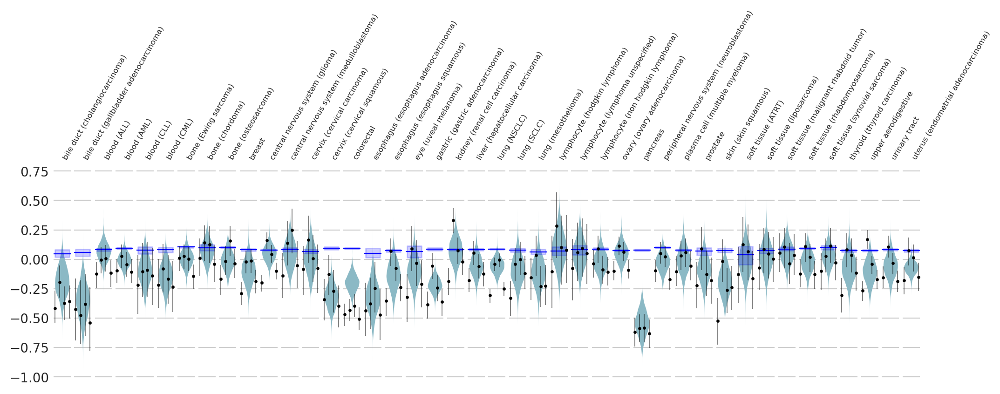

In [49]:
GENE = "KRAS"

gene_a = a_post.query(f"hugo_symbol == '{GENE}'")
gene_mu_a = mu_a_post_df.query(f"hugo_symbol == '{GENE}'")

lineages = list(gene_mu_a["lineage_subtype"].unique())
lineages.sort()

fig, axes = plt.subplots(ncols=len(lineages), figsize=(12, 3), sharex=True, sharey=True)
for ax, line in zip(axes.flatten(), lineages):
    ax.set_title(line, fontsize=6, rotation=60, ha="left")
    mu_a = mu_a_post_draws.query(f"lineage_subtype == '{line}'").assign(x=0)
    sns.violinplot(
        data=mu_a, x="x", y="mu_a", linewidth=0, color="#81BFCF", width=1, ax=ax
    )
    a = gene_a.query(f"lineage_subtype == '{line}'").assign(
        x=lambda d: np.linspace(-0.5, 0.5, len(d))
    )
    sns.scatterplot(
        data=a, x="x", y="mean", ax=ax, color="k", s=5, edgecolor=None, zorder=15
    )
    ax.vlines(
        x=a["x"],
        ymin=a["hdi_5.5%"],
        ymax=a["hdi_94.5%"],
        color="k",
        lw=0.7,
        alpha=0.5,
        zorder=5,
    )

    mu_mu_a = mu_mu_a_post.query(f"lineage_subtype == '{line}'")
    ax.axhline(y=mu_mu_a["mean"].values[0], color="blue", lw=0.8)
    hdi_low = mu_mu_a["hdi_5.5%"].values[0]
    hdi_high = mu_mu_a["hdi_94.5%"].values[0]
    ax.fill_between(
        x=[-0.5, 0.5], y1=[hdi_low] * 2, y2=[hdi_high] * 2, color="blue", alpha=0.2
    )

    ax.set_xticks([])
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.set_xlim(-0.6, 0.6)
    for d in ["top", "right", "bottom", "left"]:
        ax.spines[d].set_visible(False)

fig.tight_layout()
plt.show()

#### Correlation of order of sgRNA (Spearman correlation).

In [51]:
def avg_sgrna_spearman_corr(df: pd.DataFrame) -> pd.DataFrame:
    n_sgrna = df["sgrna"].nunique()
    if n_sgrna < 2:
        corr_avg = np.nan
    else:
        spear_corrs = (
            df.pivot_wider(["lineage_subtype"], names_from="sgrna", values_from="mean")
            .set_index("lineage_subtype")
            .corr(method="spearman")
            .values
        )
        idx = np.tril(np.ones_like(spear_corrs)).astype(bool)
        corr_avg = spear_corrs[~idx].mean()
    return pd.DataFrame(
        {
            "hugo_symbol": df["hugo_symbol"].unique(),
            "spear_corr": corr_avg,
            "n_sgrna": n_sgrna,
        },
        index=[0],
    )


sgrna_corrs = (
    a_post.groupby("hugo_symbol").apply(avg_sgrna_spearman_corr).reset_index(drop=True)
)
sgrna_corrs.head()

,hugo_symbol,spear_corr,n_sgrna
0,A1BG,0.197465,4
1,A1CF,0.188681,4
2,A2M,0.219075,4
3,A2ML1,0.403522,4
4,A3GALT2,0.039425,4


<AxesSubplot:xlabel='spear_corr', ylabel='Density'>

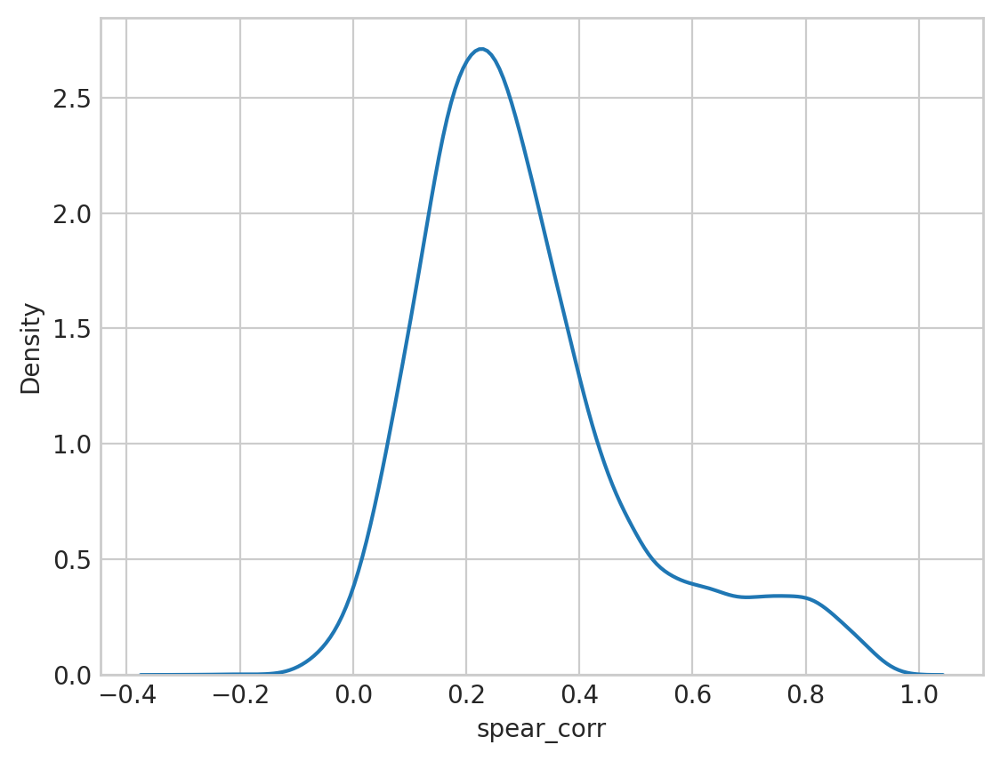

In [52]:
sns.kdeplot(data=sgrna_corrs.dropna(), x="spear_corr")

<AxesSubplot:xlabel='mu_a', ylabel='spear_corr'>

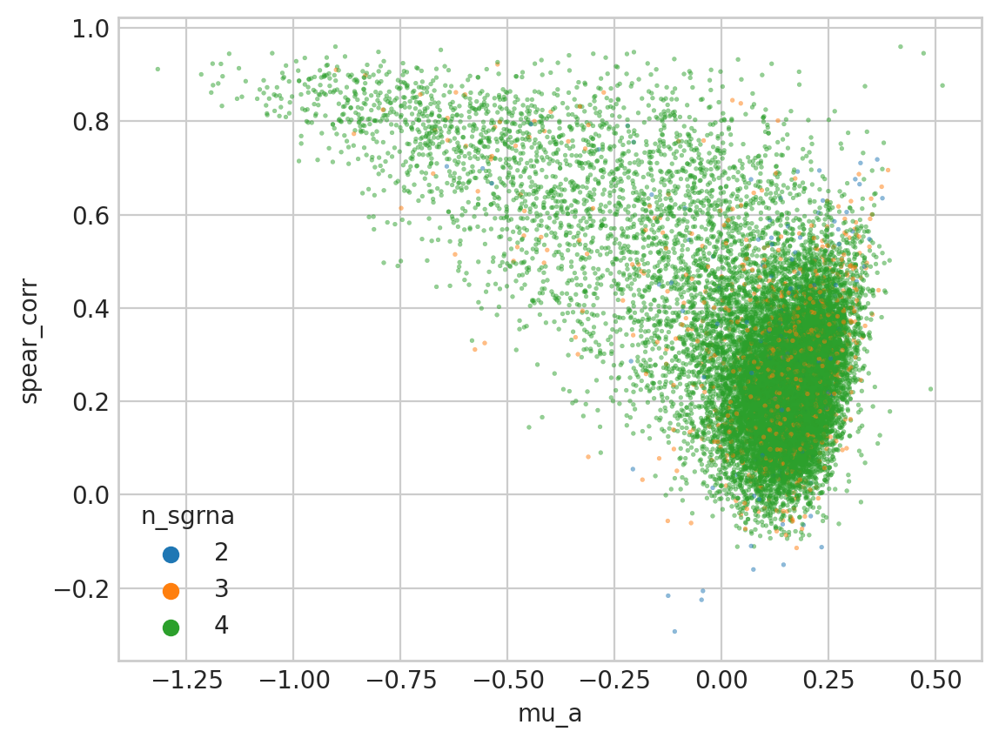

In [53]:
sgrna_corrs_mu_a = (
    mu_a_post_df.copy()
    .groupby("hugo_symbol")["mean"]
    .mean()
    .reset_index()
    .rename(columns={"mean": "mu_a"})
    .merge(sgrna_corrs, on="hugo_symbol", how="left")
    .assign(abs_mu_a=lambda d: np.abs(d["mu_a"]))
)
sns.scatterplot(
    data=sgrna_corrs_mu_a.dropna()
    .query("n_sgrna <= 4")
    .astype({"n_sgrna": "category"}),
    x="mu_a",
    y="spear_corr",
    hue="n_sgrna",
    edgecolor=None,
    s=3,
    alpha=0.5,
)

<AxesSubplot:xlabel='n_sgrna', ylabel='spear_corr'>

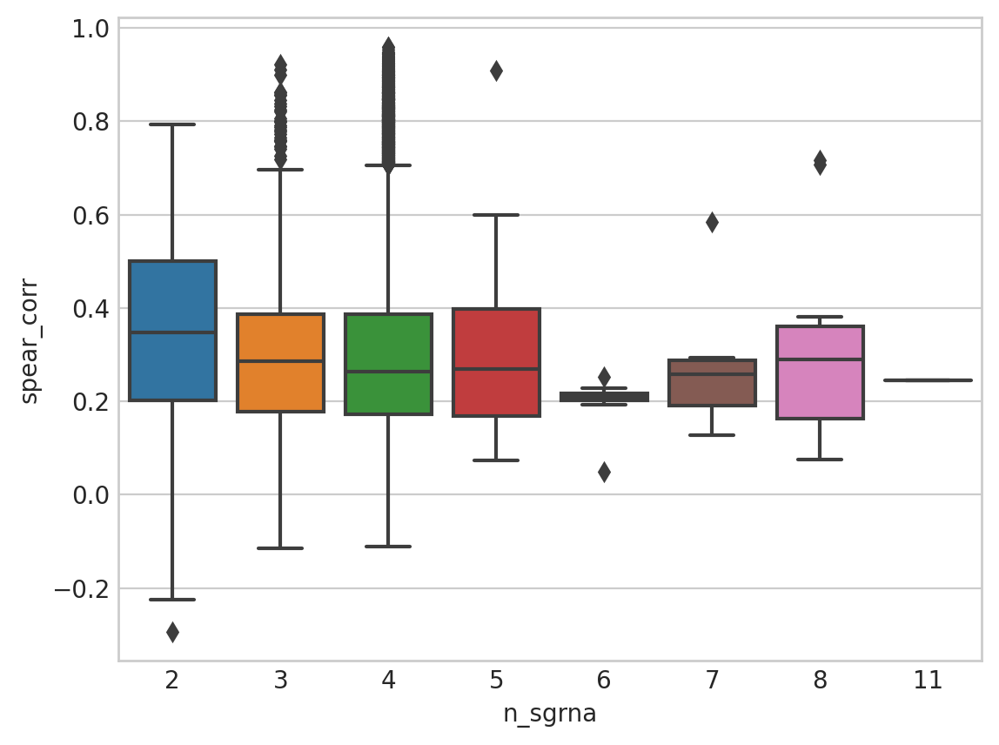

In [54]:
sns.boxplot(
    data=sgrna_corrs_mu_a.dropna().astype({"n_sgrna": "category"}),
    x="n_sgrna",
    y="spear_corr",
)

In [55]:
sgrna_corrs_mu_a.to_csv(OUTPUT_DIR / "sgrna-correlations.csv", index=False)

---

In [56]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 4.11 minutes


In [57]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-09-25

Python implementation: CPython
Python version       : 3.10.6
IPython version      : 8.5.0

Compiler    : GCC 10.4.0
OS          : Linux
Release     : 3.10.0-1160.76.1.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 28
Architecture: 64bit

Hostname: compute-e-16-231.o2.rc.hms.harvard.edu

Git branch: figures

matplotlib: 3.5.3
dask      : 2022.9.0
pandas    : 1.4.4
arviz     : 0.12.1
numpy     : 1.23.3
seaborn   : 0.11.2
gseapy    : 0.13.0

